# Analyzing Consumer Sentiment  with NLP, Scikit-Learn & Keras
Author: Pharoah Evelyn

![Twitter Banner](./images/Twitter_Banner.png)

# Overview

#### The goal of this notebook is to analyze Twitter data for sentiment, as well as build a model that can best predict Twitter sentiment

In this notebook, we will discover what users are saying about Apple & Google products en masse by using NLP techniques.
<br>
This is accomplished by inncorporating Tokenization, the removal of stopwords, annd use of Lemmatization of corpus made from the data


Modeling is done by approaching this as a classification problem. Followed by identifying sentiment as the target data.
<br>
Next, we try some Sklearn models after the use of a TF-IDF vectorizer, followed by keras models

# Importing necessary packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import nltk
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
import re
import string

sw = stopwords.words('english')

!pip install wordcloud
from wordcloud import WordCloud

from imblearn.over_sampling import SMOTE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix, ConfusionMatrixDisplay, confusion_matrix,\
                            classification_report, plot_roc_curve,\
                            mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import LinearSVC, SVC

import tensorflow as tf
import keras
from keras import layers
from keras.models import Sequential
from keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer


import warnings
warnings.filterwarnings("ignore")

2022-04-30 19:44:31.078030: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-30 19:44:31.078064: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Dataset Source
https://data.world/crowdflower/brands-and-product-emotions

In [2]:
df = pd.read_csv('data/judge-1377884607_tweet_product_company.csv', encoding='unicode_escape')
df.shape

(9093, 3)

# Exploratory Data Analysis

First, before we analyze sentiment of the data, we must clean the dataset so that it is easier to work with & parse.

Before modeling to predict sentiment, we must first have a deep understanding of what information displays. What are some general consensuses?

In [3]:
# Dropping Null Values
df = df.dropna()

df.shape

(3291, 3)

In [4]:
df

,tweet_text,emotion_in_tweet_is_directed_at,is_there_an_emotion_directed_at_a_brand_or_product
0,.@wesley83 I have a 3G iPhone. After 3 hrs twe...,iPhone,Negative emotion
1,@jessedee Know about @fludapp ? Awesome iPad/i...,iPad or iPhone App,Positive emotion
2,@swonderlin Can not wait for #iPad 2 also. The...,iPad,Positive emotion
3,@sxsw I hope this year's festival isn't as cra...,iPad or iPhone App,Negative emotion
4,@sxtxstate great stuff on Fri #SXSW: Marissa M...,Google,Positive emotion
...,...,...,...
9077,@mention your PR guy just convinced me to swit...,iPhone,Positive emotion
9079,&quot;papyrus...sort of like the ipad&quot; - ...,iPad,Positive emotion
9080,Diller says Google TV &quot;might be run over ...,Other Google product or service,Negative emotion
9085,I've always used Camera+ for my iPhone b/c it ...,iPad or iPhone App,Positive emotion


In [5]:
# Changing the column names
df.columns = ['tweets', 'product', 'emotion']
df.head()

,tweets,product,emotion
0,.@wesley83 I have a 3G iPhone. After 3 hrs twe...,iPhone,Negative emotion
1,@jessedee Know about @fludapp ? Awesome iPad/i...,iPad or iPhone App,Positive emotion
2,@swonderlin Can not wait for #iPad 2 also. The...,iPad,Positive emotion
3,@sxsw I hope this year's festival isn't as cra...,iPad or iPhone App,Negative emotion
4,@sxtxstate great stuff on Fri #SXSW: Marissa M...,Google,Positive emotion


#### Also, since we are looking for sentiment, we can eliminate entries that show no sentiment

In [6]:
df['emotion'].value_counts()

Positive emotion                      2672
Negative emotion                       519
No emotion toward brand or product      91
I can't tell                             9
Name: emotion, dtype: int64

In [7]:
df.drop(df[df['emotion'] == 'No emotion toward brand or product'].index, inplace = True)

df.drop(df[df['emotion'] == 'I can\'t tell'].index, inplace = True)

df['emotion'].value_counts()

Positive emotion    2672
Negative emotion     519
Name: emotion, dtype: int64

#### Next, we shall investigate to see if there are any duplicated entries. If present, we will clear these out from our dataset

In [8]:
len(df[df['tweets'].duplicated()])

9

In [9]:
# Dropping duplicated entries
df = df.drop_duplicates(keep='first')
df.shape

(3182, 3)

#### We have removed 6066 rows of unuseful data, from this dataset!

In [10]:
df

,tweets,product,emotion
0,.@wesley83 I have a 3G iPhone. After 3 hrs twe...,iPhone,Negative emotion
1,@jessedee Know about @fludapp ? Awesome iPad/i...,iPad or iPhone App,Positive emotion
2,@swonderlin Can not wait for #iPad 2 also. The...,iPad,Positive emotion
3,@sxsw I hope this year's festival isn't as cra...,iPad or iPhone App,Negative emotion
4,@sxtxstate great stuff on Fri #SXSW: Marissa M...,Google,Positive emotion
...,...,...,...
9077,@mention your PR guy just convinced me to swit...,iPhone,Positive emotion
9079,&quot;papyrus...sort of like the ipad&quot; - ...,iPad,Positive emotion
9080,Diller says Google TV &quot;might be run over ...,Other Google product or service,Negative emotion
9085,I've always used Camera+ for my iPhone b/c it ...,iPad or iPhone App,Positive emotion


# NLP Preprocessing

In this section, we will tokenize our tweets based on sentiment & see what words are common among both company's products

First, let's split our dataframe into positive & negative tweets, regardless of company

![Apple_vs_Google](./images/Apple_vs_Google.jpeg)

In [11]:
pos_tweets = df[df['emotion'] == 'Positive emotion']
neg_tweets = df[df['emotion'] == 'Negative emotion']

In [12]:
# Looking at the Class distributions in detail
print("Positive Tweets:")
print(pos_tweets['product'].value_counts())

print('\n')

print("Negative Tweets:")
print(neg_tweets['product'].value_counts())

Positive Tweets:
iPad                               792
Apple                              541
iPad or iPhone App                 396
Google                             344
Other Google product or service    236
iPhone                             184
Android App                         71
Android                             68
Other Apple product or service      32
Name: product, dtype: int64


Negative Tweets:
iPad                               125
iPhone                             102
Apple                               95
Google                              68
iPad or iPhone App                  63
Other Google product or service     47
Android                              8
Android App                          8
Other Apple product or service       2
Name: product, dtype: int64


With this, I see that there is a large class imbalance present in both cases

We might have to address this later, and perform Sentiment Analysis on each class

In [13]:
# Parsing tweets into a list
corpus_pos = pos_tweets['tweets'].to_list()
corpus_neg = neg_tweets['tweets'].to_list()

#### Tokenization

In [14]:
def tokenize_corpus(corpus):
    # Find words that may have apostrophes in your document
    pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
    tokenizer = RegexpTokenizer(r"([a-zA-Z]+(?:[’'][a-z]+)?)")
    corpus = tokenizer.tokenize(','.join(corpus))
    
    # Take out all punctuation, and lowercase each word in document
    corpus = [token.lower() for token in corpus]
    
    return corpus

#### Stopwords

In [15]:
sw = stopwords.words('english')

def remove_sw(corpus, stops=sw):
    # Code borrowed from E. Berke Tezcan on GitHub
    # https://github.com/ebtezcan/Apple-Google-NLP-Analysis
    
    corpus = [token for token in corpus if token not in stops]
    
    return corpus

# Tokenize positive tweets
tokens_pos = tokenize_corpus(corpus_pos)

# Remove stopwords
tokens_pos = remove_sw(tokens_pos)

## Lemmatization

In [16]:
def lemmatize_tokens(tokens_list):

    lemmatizer = WordNetLemmatizer()
    tokens_lemm = [lemmatizer.lemmatize(word) for word in tokens_list]
    return tokens_lemm

In [17]:
nltk.download('wordnet')
lemmatizer = nltk.stem.WordNetLemmatizer()

pos_tweets_lemmed=lemmatize_tokens(tokens_pos)

[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [18]:
# Show number of unique lemmas
print(f'There are {len(set(pos_tweets_lemmed))} unique lemmas.')

There are 4282 unique lemmas.


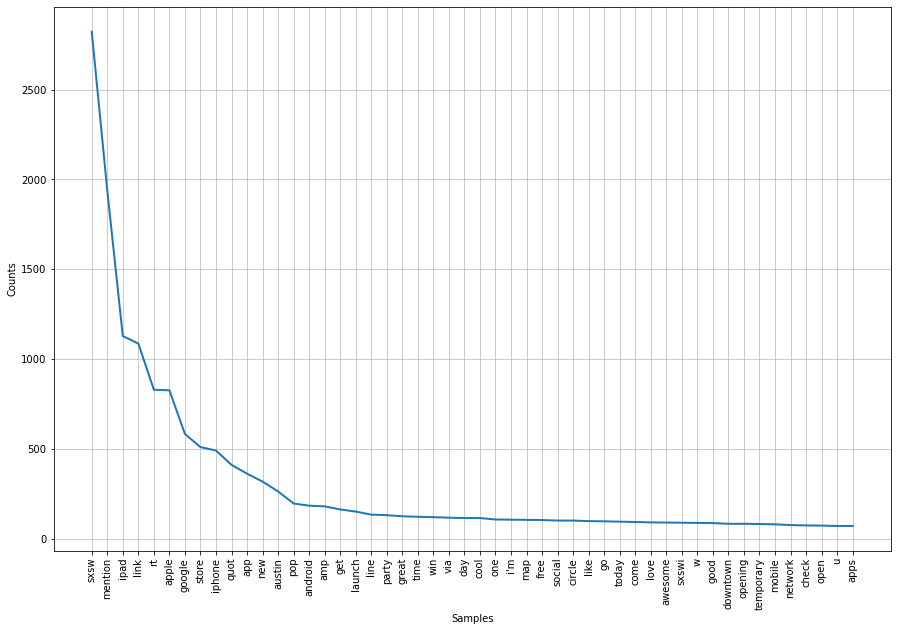

In [19]:
# Plot word frequency

fdist = FreqDist(pos_tweets_lemmed)
plt.figure(figsize=(15, 10))
fdist.plot(50);

#### Additional Stopwords

Here, since some tokens seem to be have informatin about the event itself, and its location: it might be a good idea to add `sxsw`, `sxswi`, & `austin` words to the `stopwords` list. So we can have a more focused analysis 

We also see words like `rt`, `mention` & `link`, which also do not seem to provide much information abbout sentiment. Let's investigate

In [20]:
def context_finder(word, corpus, n_samples=7, n_count =7):
    # Code borrowed from E. Berke Tezcan on GitHub
    # https://github.com/ebtezcan/Apple-Google-NLP-Analysis
    i=0
    
    for _ in list(range(0, n_samples)):
        sample = np.random.choice(corpus, n_count)
        for tweet in sample:
            if word in tweet:
                print(tweet)
                i+=1
    
    print('---------------------------------------')
    print(f'Out of {n_count*n_samples} tweets analyzed,\
    {i} tweets had the word "{word}" in item.')

In [21]:
context_finder('rt', corpus_pos)

@mention crew ripped up Android party - thanks for having us Droid! {link} #sxsw
@mention That RT makes me want 1) an iPhone (to use Uppward) 2) a tshirt (clever design!) 3) to be at #SXSW. Jerk.
Smart company. RT @mention It's not a rumor: Apple opening up a temporary store in downtown Austin for #SXSW &amp;iPad 2 launch bit.ly/g03MZB
The Google / ACLU party tonight at #sxsw is the best thing ever. (And apparently, the Spazmatics are a franchised band. But they rock.)
ballroom d: #marissagoogle talking about some cool projects (obv). love the Google Art Project. #sxsw
Google earth engine are providing tech to indigenous tribes to report on statuses of forests. This is more like it #saveustechies #sxsw
RT @mention NYT app for iPad: not &quot;here's an amazing way to serve our readership,&quot; more &quot;here's a market opportunity we can't ignore.&quot; #sxsw #newsapps
Photo booth action at the @mention and Google party! Who doesn't love a good photo booth #sxsw  {link}
RT @mention #i

It seems `rt` simply denotes when someone 'retweets' on twitter. It's good to add this to our droplist

In [22]:
context_finder('link', corpus_pos)

My first #SXSW blog post for the @mention Grand opening of the Apple popup store {link}
checking out iPad 2 @mention the #sxsw pop-up store (@mention Apple Store, SXSW w/ 17 others) {link}
#SXSW #Google Saving Drivers Time and Fuel {link} #seo #sem #googlemaps #mobile #topnews
Someone's buying herself a present ;-) RT @mention Apple Is Opening A Pop-Up Store In Austin For #SXSW {link}
RT @mention Wow, this thing is insanely thin &amp; light. Hold out for the iPad 2. Seriously. #sxsw #mosaicxm  {link}
Just finished taking photos in the #Google photobooth! You know I heart you! #SXSW (@mention Maggie Mae's w/ 101 others) {link}
Whoa! line at the pop up apple store in downtown austin. iPad midnight madness.  #sxsw  {link}
This is a #WINNING picture #android #google #sxsw {link}
Packed house-go Lynn!  Designing iPad Interfaces - New Navigation Schemas at #SXSW #UXDes
{link}
RT @mention @mention your iPhone 4 cases are Rad and Ready! Stop by tomorrow to get them! #Sxsw #zazzlesxsw #sxswi {l

It seems `link` simply denotes where a URL would have been, in a tweet. It's good to add this to our stoplist

In [23]:
context_finder('mention', corpus_pos)

@mention Saw you awesome educational iPhone music app tunehopper.  Good
Luck. #sxsw
LOL very interesting! ÛÏ@mention ÛÏ@mention @mention next platform for Flipboard is the iPhone Team started working on it #SXSWÛ
most inspiring and down to heart session about iphone app design so far! Thanks @mention #sxsw
RT @mention Join {link} and starting tonight the person with the most friends in their city by end of #SXSW Festival wins an iPad 2!!!
So @mention is back from #sxsw and he's brought an iPad 2 *slips it into his bag* Jammy bugger
Thank you! :) RT @mention Just picked up @mention book: Killer Photoes with your IPhone! #SXSW #sxswchi  {link} #SXSWi
RT @mention Cunning Apple, keeping the #iPad2 popup store open late next to #sxsw parties for impulsive latÛ_ (cont) {link}
Off to see @mention in &quot;Left Brain Search = Google. Right Brain Search = X&quot; panel at #SXSW #BetterSearch
Looks like all the apps for #SXSW are for the #iPhone. What about the #blackberry? The blackberry??

A mention is a Tweet that contains another person's username anywhere in the body of the Tweet. It's good to add this to our stoplist

In [24]:
context_finder('quot', corpus_neg)

overheard at MDW (and I'll second it) &quot;halfway through my iPhone battery already and I haven't even boarded the plane to #sxsw&quot; #amateurhour
RT @mention Best thing I've heard this weekend at #SXSW &quot;I gave my iPad 2 money to #Japan relief. I don't need an iPad 2.&quot; @mention
overheard at MDW (and I'll second it) &quot;halfway through my iPhone battery already and I haven't even boarded the plane to #sxsw&quot; #amateurhour
RT @mention Best thing I've heard this weekend at #SXSW &quot;I gave my iPad 2 money to #Japan relief. I don't need an iPad 2.&quot; @mention
I'm pretty sure the panelist that thinks &quot;Apple is drowning in their success&quot; is fucking insane. #SXSW
RT @mention #sxsw WAZE {link} is duking it out with google re: personalized mapping experience. Friendly &quot;panel crashing&quot;
Guy Kawasaki &quot;I believe in God because there is no other explanation for the continuous survival of Apple over the years.&quot;. LOL #SXSW
@mention Best thing I've 

It seems quot also denotes some sort of text formatting within a tweet. We can add it to our stoplist

In [25]:
# Adding Stopwords
sw += ['sxsw', 'sxswi', 'austin', 'rt', 'link', 'mention', 'quot']

# Removing Stopwords
pos_tweets_lemmed = remove_sw(pos_tweets_lemmed)

In [26]:
# Show number of unique lemmas
print(f'There are {len(set(pos_tweets_lemmed))} unique lemmas.')

There are 4271 unique lemmas.


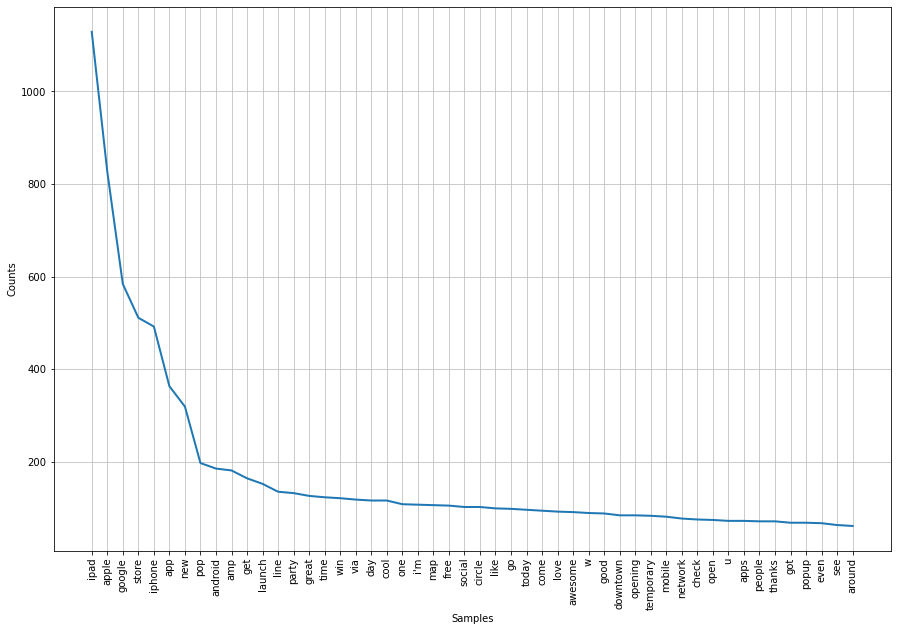

In [27]:
# Plot word frequency
fdist = FreqDist(pos_tweets_lemmed)
plt.figure(figsize=(15, 10))
fdist.plot(50);

#### Repeating steps for our negative tweets

In [28]:
# Tokenize negative tweets
tokens_neg = tokenize_corpus(corpus_neg)

# Remove stopwords
tokens_neg = remove_sw(tokens_neg)

In [29]:
neg_tweets_lemmed=lemmatize_tokens(tokens_neg)

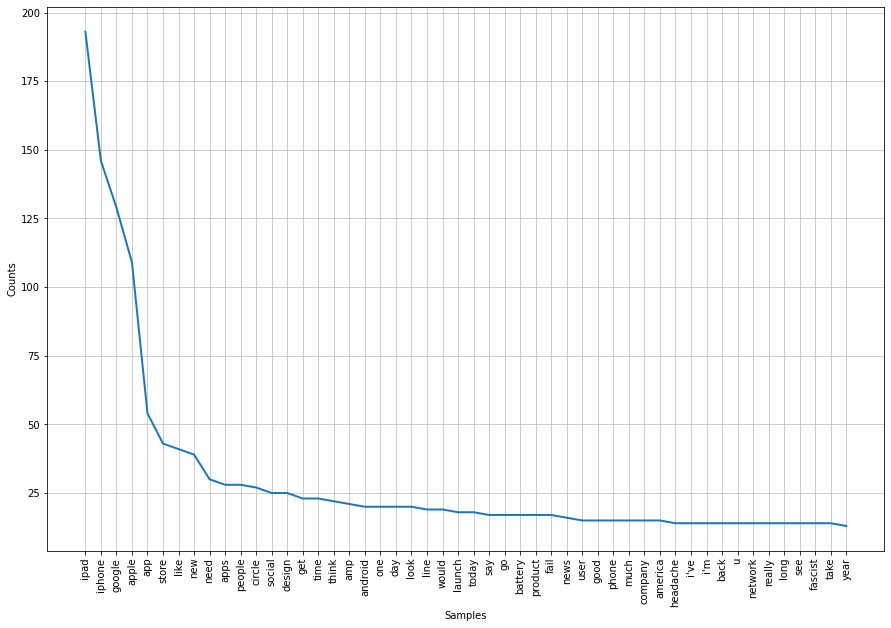

In [30]:
# Plot word frequency
fdist = FreqDist(neg_tweets_lemmed)
plt.figure(figsize=(15, 10))
fdist.plot(50);

## Visualizing NLP with Word Clouds
In this section, we quickly visualize the words in our dataset based on sentiment

We also take a look at how sentiment compares between products, and in between the companies themselves.

![Blue-Sky](./images/Blue-Sky-White-Clouds.png)

In [31]:
# defining a function for wordcloud generation
def generate_wordcloud(tokens, collocations=False, 
                       background_color='black', 
                       colormap='Spectral', 
                       display=True):
    # Code borrowed from E. Berke Tezcan on GitHub
    # https://github.com/ebtezcan/Apple-Google-NLP-Analysis
    
    ## Initalize a WordCloud
    wordcloud = WordCloud(collocations=collocations,
                          background_color=background_color,
                          colormap=colormap,
                          width=500, height=300)

    ## Generate wordcloud from tokens
    wordcloud.generate(','.join(tokens))

    ## Plot with matplotlib
    if display:
        plt.figure(figsize = (12, 15), facecolor = None)
        plt.imshow(wordcloud)
        plt.axis('off')
    return wordcloud

#### Positive Tweets Wordcloud

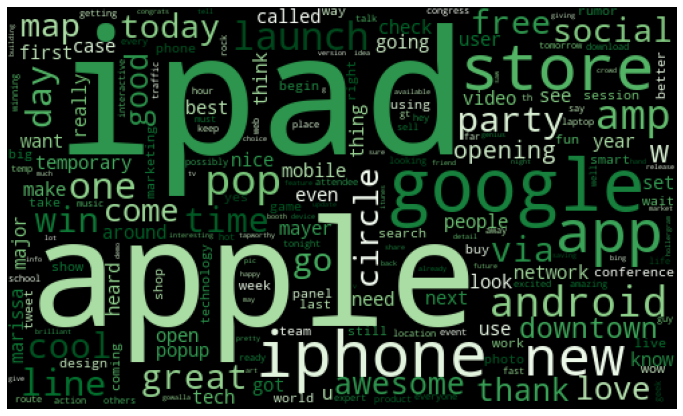

In [32]:
positive_wc = generate_wordcloud(pos_tweets_lemmed, colormap='Greens')
positive_wc

#### Negative Tweets Wordcloud

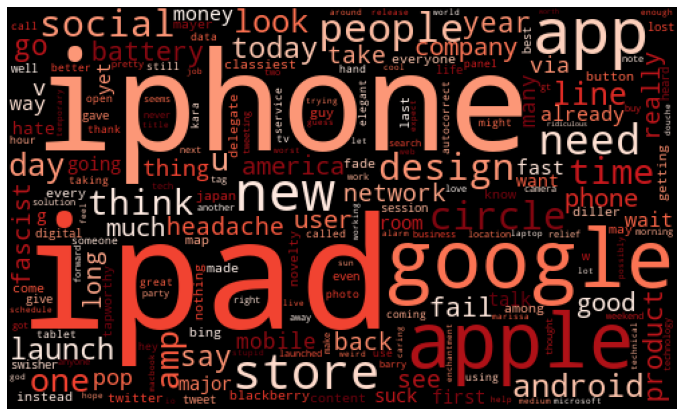

In [33]:
negative_wc = generate_wordcloud(neg_tweets_lemmed, colormap='Reds')
negative_wc

#### As we can see, there are alot of mentions of thee products themselves in these word clouds.
Lets get rid of this information to see what remains

In [34]:
# Creating a stoplist with product/company information
new_stops = sw + ['ipad', 'ipad 2', 'iphone', 'apple', 'google', 'app']

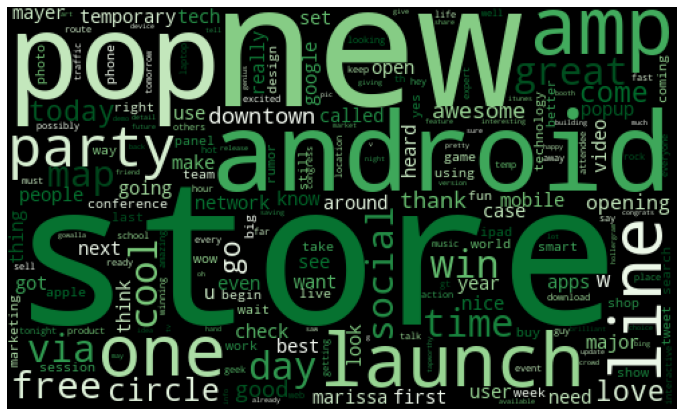

In [35]:
# Cloud without product/company information
pos_list_new = remove_sw(pos_tweets_lemmed, stops=new_stops)
pos_cloud_wo_company = generate_wordcloud(pos_list_new, colormap='Greens')
pos_cloud_wo_company

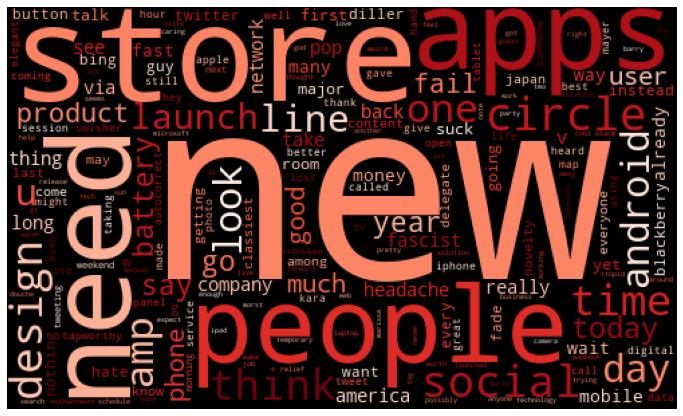

In [36]:
# Cloud without product/company information
neg_list_new = remove_sw(neg_tweets_lemmed, stops=new_stops)
neg_cloud_wo_company = generate_wordcloud(neg_list_new, colormap='Reds')
neg_cloud_wo_company

### Comparing our visualizations, for ease of use

In [37]:
def compare_wordclouds(wc1, wc2):
    fig, ax = plt.subplots(figsize=(30,20), ncols=2)

    ax[0].set_title('Positive Word Cloud', fontsize=40)
    ax[0].imshow(wc1)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
    ax[1].set_title('Negaitive Word Cloud', fontsize=40)
    ax[1].imshow(wc2)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    plt.tight_layout();

#### Positive WordCloud with Product Information

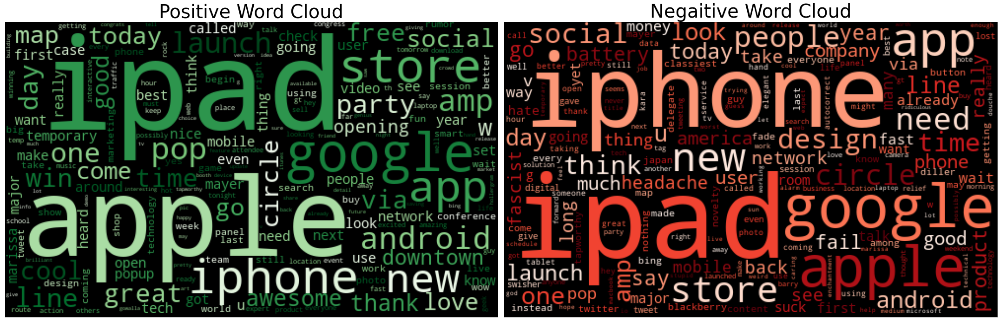

In [38]:
compare_wordclouds(positive_wc, negative_wc)

#### Positive WordCloud without Product Information

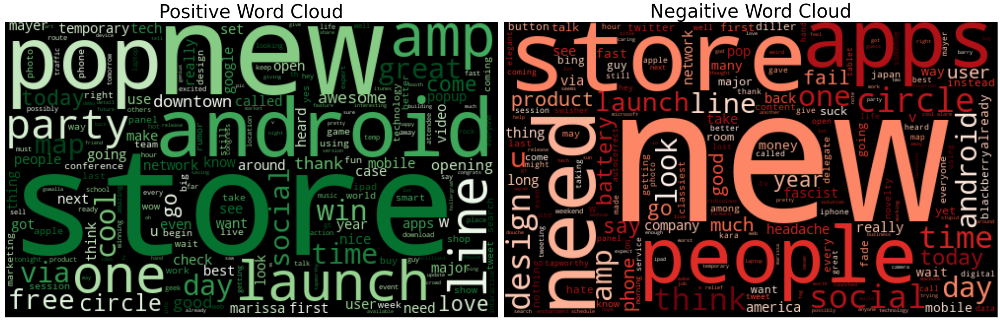

In [39]:
compare_wordclouds(pos_cloud_wo_company, neg_cloud_wo_company)

## Apple Tweets

In [40]:
#mapping products to brands
brand_dict={'iPhone': 'Apple', 'iPad or iPhone App': 'Apple', 'iPad': 'Apple',
 'Google': 'Google', 'Unknown': 'Unknown',
 'Android': 'Google', 'Apple': 'Apple', 'Android App': 'Google',
 'Other Google product or service': 'Google',
 'Other Apple product or service': 'Apple'}
df['brand'] = df['product'].map(brand_dict)
df['brand'].unique()

array(['Apple', 'Google'], dtype=object)

In [41]:
df_apple = df[df['brand']=='Apple']
corpus_apple = df_apple['tweets'].to_list()

In [42]:
#tokenize tweets
tokens_apple = tokenize_corpus(corpus_apple)
#lemmatize tweets
tokens_apple_lemm=lemmatize_tokens(tokens_apple)
#remove stop words & punctuation using the same stop words list
tokens_apple_ls = remove_sw(tokens_apple_lemm, stops = sw)

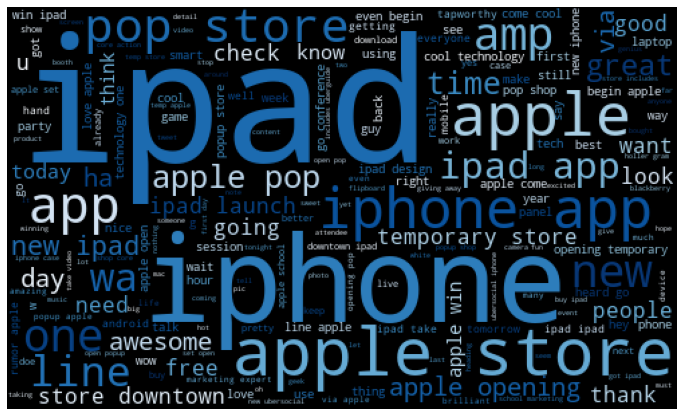

In [43]:
# Wordcloud for apple tokens
generate_wordcloud(tokens_apple_ls, colormap='Blues', collocations=True)

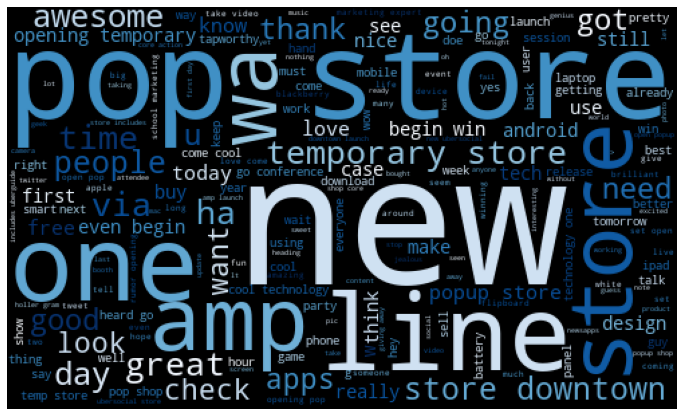

In [44]:
# Wordcloud for apple tokens without product information
tokens_apple_ls = remove_sw(tokens_apple_ls, stops = new_stops)
generate_wordcloud(tokens_apple_ls, colormap='Blues', collocations=True)

In [45]:
apple_sentiment = pd.DataFrame(df_apple['emotion'].value_counts(normalize=True).reset_index(drop=False))
apple_sentiment.columns = ['emotion', 'percentage']
apple_sentiment

,emotion,percentage
0,Positive emotion,0.834048
1,Negative emotion,0.165952


#### Now, lets look at apple tweets and see what's recieved as positive & negative tweets

In [46]:
apple_pos_tweets = df_apple[df_apple['emotion'] == 'Positive emotion']
apple_neg_tweets = df_apple[df_apple['emotion'] == 'Negative emotion']

In [47]:
corpus_apple_pos = apple_pos_tweets['tweets'].to_list()
corpus_apple_neg = apple_neg_tweets['tweets'].to_list()

In [48]:
#tokenize positive tweets
tokens_apple_pos = tokenize_corpus(corpus_apple_pos)
#lemmatize positive tweets
tokens_apple_pos_lemm=lemmatize_tokens(tokens_apple_pos)
#remove stop words & punctuation using the same stop words list
tokens_apple_pos_ls = remove_sw(tokens_apple_pos_lemm, stops = new_stops)

#tokenize negative tweets
tokens_apple_neg = tokenize_corpus(corpus_apple_neg)
#lemmatize negative tweets
tokens_apple_neg_lemm=lemmatize_tokens(tokens_apple_neg)
#remove stop words & punctuation using the same stop words list
tokens_apple_neg_ls = remove_sw(tokens_apple_neg_lemm, stops = new_stops)

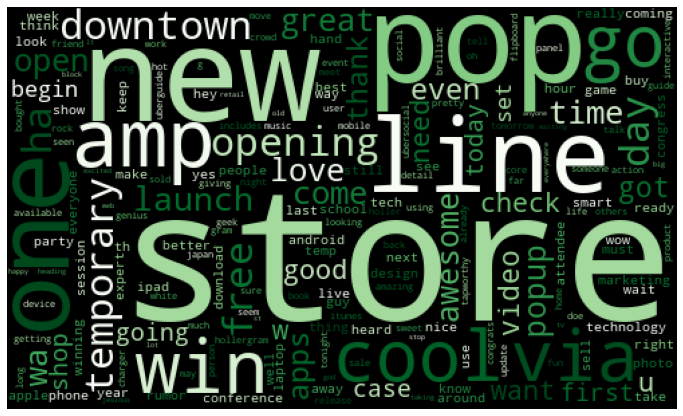

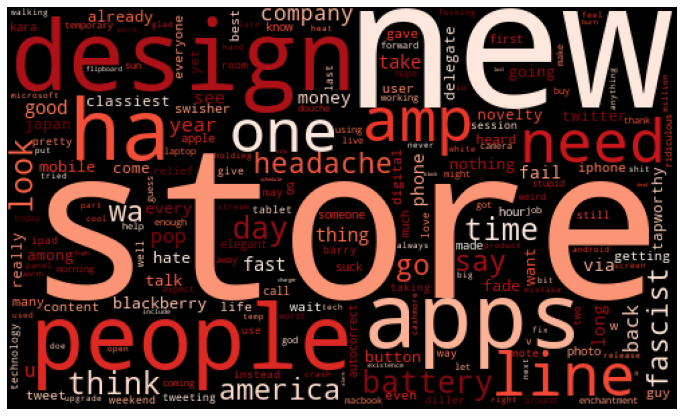

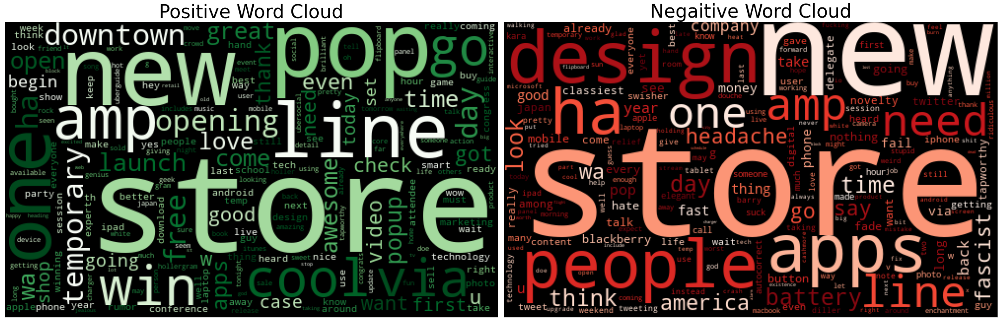

In [49]:
apple_tokens_pos_wc = generate_wordcloud(tokens_apple_pos_ls, colormap='Greens')

apple_tokens_neg_wc = generate_wordcloud(tokens_apple_neg_ls, colormap='Reds')

compare_wordclouds(apple_tokens_pos_wc, apple_tokens_neg_wc)

## Google Tweets
We will repeat all steps for Google's tweets

In [50]:
df_google = df[df['brand']=='Google']
corpus_google = df_google['tweets'].to_list()

In [51]:
#tokenize tweets
tokens_google = tokenize_corpus(corpus_google)

#lemmatize tweets
tokens_google_lemm=lemmatize_tokens(tokens_google)

#remove stop words & punctuation using the same stop words list
tokens_google_ls = remove_sw(tokens_google_lemm, stops = sw)

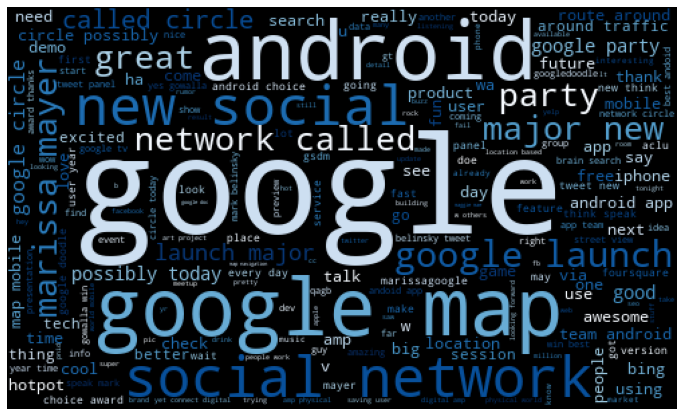

In [52]:
# Wordcloud for apple tokens
generate_wordcloud(tokens_google_ls, colormap='Blues', collocations=True)

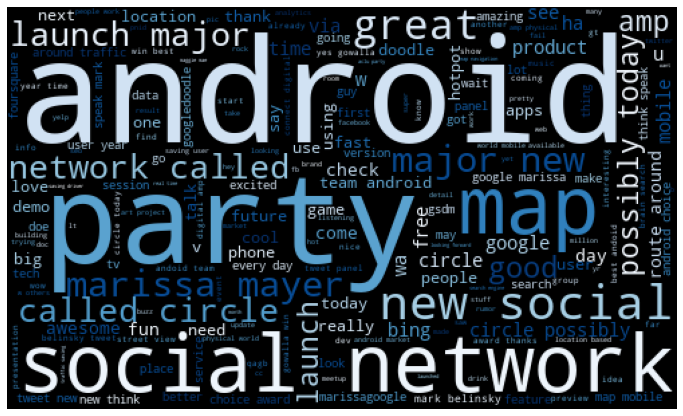

In [53]:
# Wordcloud for apple tokens without product information
tokens_google_ls = remove_sw(tokens_google_ls, stops = new_stops)
generate_wordcloud(tokens_google_ls, colormap='Blues', collocations=True)

In [54]:
google_sentiment = pd.DataFrame(df_google['emotion'].value_counts(normalize=True).reset_index(drop=False))
google_sentiment.columns = ['emotion', 'percentage']
google_sentiment

,emotion,percentage
0,Positive emotion,0.845882
1,Negative emotion,0.154118


#### Now, lets look at google tweets and see what's recieved as positive & negative tweets

In [55]:
google_pos_tweets = df_google[df_google['emotion'] == 'Positive emotion']
google_neg_tweets = df_google[df_google['emotion'] == 'Negative emotion']

In [56]:
corpus_google_pos = google_pos_tweets['tweets'].to_list()
corpus_google_neg = google_neg_tweets['tweets'].to_list()

In [57]:
#tokenize positive tweets
tokens_google_pos = tokenize_corpus(corpus_google_pos)
#lemmatize positive tweets
tokens_google_pos_lemm=lemmatize_tokens(tokens_google_pos)
#remove stop words & punctuation using the same stop words list
tokens_google_pos_ls = remove_sw(tokens_google_pos_lemm, stops = new_stops)

#tokenize negative tweets
tokens_google_neg = tokenize_corpus(corpus_google_neg)
#lemmatize negative tweets
tokens_google_neg_lemm=lemmatize_tokens(tokens_google_neg)
#remove stop words & punctuation using the same stop words list
tokens_google_neg_ls = remove_sw(tokens_google_neg_lemm, stops = new_stops)

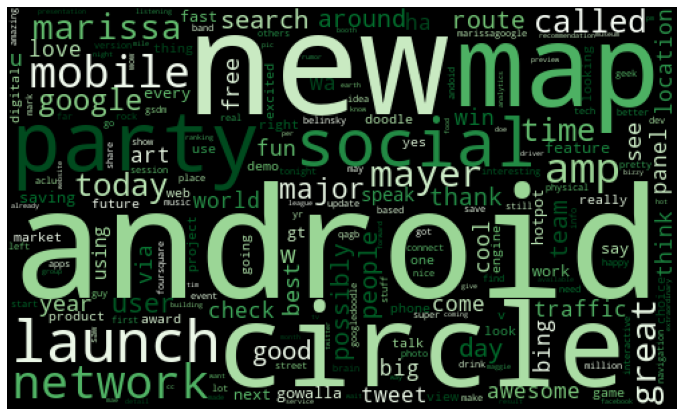

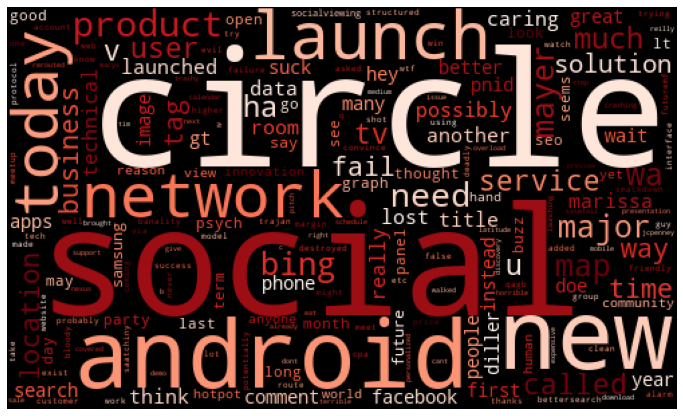

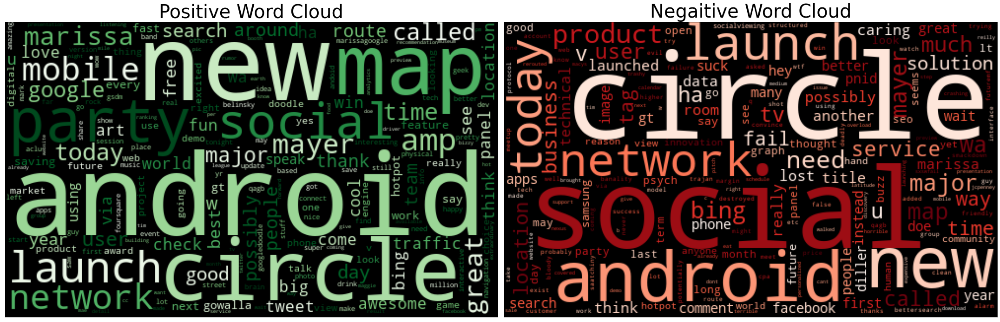

In [58]:
google_tokens_pos_wc = generate_wordcloud(tokens_google_pos_ls, colormap='Greens')

google_tokens_neg_wc = generate_wordcloud(tokens_google_neg_ls, colormap='Reds')

compare_wordclouds(google_tokens_pos_wc, google_tokens_neg_wc)

## Sentiment Analysis
Comparing our 2 charts

Text(0.5, 1.0, 'Sentiment Percentages for Tweets about Google')

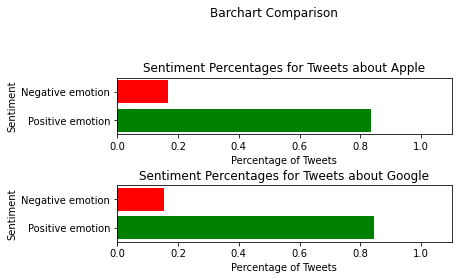

In [59]:
fig, (ax1, ax2) = plt.subplots(2)

fig.suptitle('Barchart Comparison')
fig.tight_layout(pad=3.0) # Creates spacing in our plots

# Apple Plot
ax1.barh(apple_sentiment['emotion'], apple_sentiment['percentage'],
 color=['Green', 'Red'])
ax1.set_xlim(0, 1.1)
ax1.set_xlabel('Percentage of Tweets')
ax1.set_ylabel('Sentiment')
ax1.set_title('Sentiment Percentages for Tweets about Apple')

# Google Plot
ax2.barh(google_sentiment['emotion'], google_sentiment['percentage'],
 color=['Green', 'Red'])
ax2.set_xlim(0, 1.1)
ax2.set_xlabel('Percentage of Tweets')
ax2.set_ylabel('Sentiment')
ax2.set_title('Sentiment Percentages for Tweets about Google')

# EDA Conclusions & Analysis

#### How does Apple compare to Google in sentiment analysis?¶
Google & Apple appear to have strikingly similar levels of positive sentiment over their products, so there isn't a real winner here.

#### What are people most excited about?
It appears people are most excited about new products all around. As expected for new releases at significant events such as SXSW.

#### For Apple:
<br>
We see much excitement for a popup store & its location downtown, which sells the latest products.
<br>
Unfortunately, we can see that some apple users are experiencing issues with their battery life. Some users also do not approve of Apple's new product design. Also,  it seems some people are calling Apple fascist.

#### For Google:
<br>
There is much buzz for Google Circle (a social network) in this dataset and Google Maps. We also see much mention of Marissa Mayer, a prolific businesswoman.
<br>
We also see that some users are experiencing interface issues in the same breath.

#### What can we gain from this information?
We can gain that though there was a bunch of positivity in our dataset of tweets, we can perceive a level of mixed reception since the negatives show discontent with the launch of products, new features & new designs of various products.

# Modeling

![Data-Lighbulb](./images/Data-Lightbulb.jpg)

## First, lets isolate the data that we want to use for modeling purposes

In [60]:
data = df[['tweets', 'emotion']]

# Binarizing our target column
data['emotion'] = data['emotion'].replace(
    {'Negative emotion': 0, 'Positive emotion': 1})

We need to clean our text, apply lemmatization and remove stopwords from our `data` dataset

Afterwards, we must create a wordcount, split the data, and then create a sequences of words after keras tokenization. This will prepare the data for modeling with Scikit-Learn & Keras 

In [61]:
# Defining function to clean text within our dataframe

def clean_text(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    
    '''Get rid of some additional punctuation and non-sensical text that was missed the first time around.'''
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
    return text

def lem_tweets(data):
    '''Applyinng Lemmatization to the data'''
    text = [lemmatizer.lemmatize(word) for word in data]
    return data
    
def rm_stops(text):
    '''Cleaning & removing stop words from the dataframe'''
    return " ".join([word for word in str(text).split() if word not in new_stops])


In [62]:
data['tweets_clean'] = data['tweets'].apply(lambda x: clean_text(x))
data['tweets_clean'] = data['tweets_clean'].apply(lambda x: lem_tweets(x))
data['tweets_clean'] = data['tweets_clean'].apply(lambda x: rm_stops(x))

In [63]:
X=data.tweets_clean
y=data.emotion

#### Splitting our data into a Train & Test sets

In [64]:
X_train, X_test, y_train, y_test = train_test_split(
                                X, y, test_size = 0.15, 
                                random_state =42)

#### Transforming our data using a TF-IDF Vectorizer

In [65]:
vectorizer = TfidfVectorizer(ngram_range=(1,2))

#Fitting the vectorizer to the data
vec_X_train = vectorizer.fit_transform(X_train)
vec_X_test  = vectorizer.transform(X_test)

## Addressing Class Weights

As we noticed earler, the classes are imbalanced.
#### We can address this by assigning custom weights for modeling, using the `class_weight` parameter

In [66]:
# Discovering the total number of entries in are target training data
len(y_train)

2704

In [67]:
# Captures the ammount of occurences of each class in the training set

count = np.bincount(y_train)
print(count[0]) # Minority class
print(count[1]) # Majority class

440
2264


In [68]:
# Automatically assign the weights for each class from the training data

# We must give the minority class the higher weight, to balance the scale against the number of occurences
# We do this by calculating the percentages of each class in the data 

w0 = count[1]/len(y_train) # Assigning majority percentage
w1 = count[0]/len(y_train) # Assigning minority percentage

print(w0) # Adjusted weight for the minority class
print(w1) # Adjusted weight for the majority class

0.8372781065088757
0.16272189349112426


#### Using SMOTE to address class imbalances
We will only use SMOTE for the Naive Bayes model, for sampling purposes.

Smote in general is an advanced technique, however, synthetic samples may not be interpretable when decoded.

Every other model will use the `class_weight` parameter, account for the class imbalance

In [69]:
# Previous original class distribution
print(y_train.value_counts()) 

# Fit SMOTE to training data
vec_X_train_resampled, y_train_resampled = SMOTE().fit_resample(vec_X_train, y_train) 

# Preview synthetic sample class distribution
print('\n')
print(pd.Series(y_train_resampled).value_counts()) 

1    2264
0     440
Name: emotion, dtype: int64


1    2264
0    2264
Name: emotion, dtype: int64


### Defining functions for model evaluation

In [70]:
metrics_df = []
def get_classification_report(y_test, y_pred):
    # This function returns a clean classification report in a pandas dataframe format
    from sklearn import metrics
    report = classification_report(y_test, y_pred, output_dict=True)
    df_classification_report = pd.DataFrame(report).transpose()
    
    ##### reindex or change the order of rows
    df_classification_report.reindex(['0', '1', 'accuracy', 'weighted avg', 'macro avg'])
    
    #### Returning Capitalized column names
    df_classification_report.columns = df_classification_report.columns.str.capitalize()

    # Creates a 3-D dataframe
    metrics_df.append(df_classification_report.iloc[1:2, :])
    return df_classification_report


def model_results(model, X_test, y_test):
    # This function returns various metrics for our models that we run

    preds = model.predict(X_test)
    
    # A visual representation of a confusion Matrix
    plot_confusion_matrix(model, X_test, y_test);    
    plt.grid(False)
    
    # Prints the MAE & RMSE of a model
    print('Mean Absolute Error:', mean_absolute_error(y_test, preds)) 
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, preds)))

    # Plots the ROC Curve & Returns the AUC score
    plot_roc_curve(model, X_test, y_test);

### Bernoulli Naive Bayes Model

Mean Absolute Error: 0.13598326359832635
Root Mean Squared Error: 0.36875908612307623


,Precision,Recall,F1-score,Support
0,0.760000,0.243590,0.368932,78.000000
1,0.869757,0.985000,0.923798,400.000000
accuracy,0.864017,0.864017,0.864017,0.864017
macro avg,0.814879,0.614295,0.646365,478.000000
weighted avg,0.851847,0.864017,0.833255,478.000000


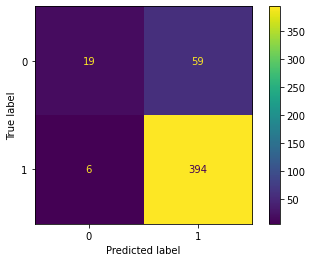

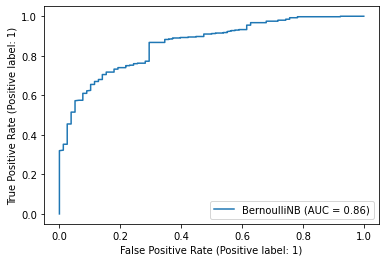

In [71]:
BNBmodel = BernoulliNB()
BNBmodel.fit(vec_X_train_resampled, y_train_resampled)

# Displays results of the model
model_results(BNBmodel, vec_X_test, y_test)

# Returns Classification Report
get_classification_report(y_test, BNBmodel.predict(vec_X_test))

### SVM Model

Mean Absolute Error: 0.1297071129707113
Root Mean Squared Error: 0.360148737288792


,Precision,Recall,F1-score,Support
0,0.637931,0.474359,0.544118,78.000000
1,0.902381,0.947500,0.924390,400.000000
accuracy,0.870293,0.870293,0.870293,0.870293
macro avg,0.770156,0.710929,0.734254,478.000000
weighted avg,0.859228,0.870293,0.862337,478.000000


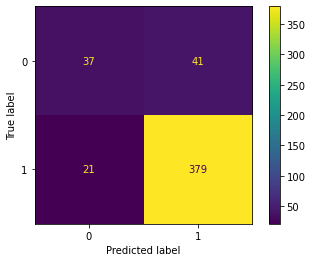

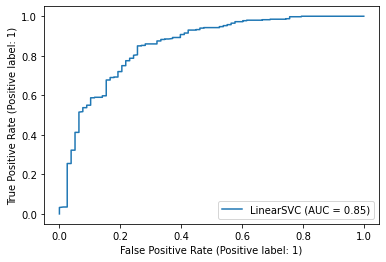

In [72]:
SVCmodel = LinearSVC(class_weight={0: w0, 1: w1})
SVCmodel.fit(vec_X_train, y_train)

# Displays results of the model
model_results(SVCmodel, vec_X_test, y_test)

# Returns Classification Report
get_classification_report(y_test, SVCmodel.predict(vec_X_test))

### Logistic Regression Model

Mean Absolute Error: 0.13598326359832635
Root Mean Squared Error: 0.36875908612307623


,Precision,Recall,F1-score,Support
0,0.584416,0.576923,0.580645,78.000000
1,0.917706,0.920000,0.918851,400.000000
accuracy,0.864017,0.864017,0.864017,0.864017
macro avg,0.751061,0.748462,0.749748,478.000000
weighted avg,0.863319,0.864017,0.863663,478.000000


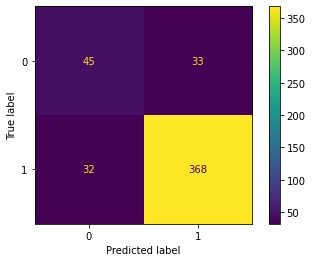

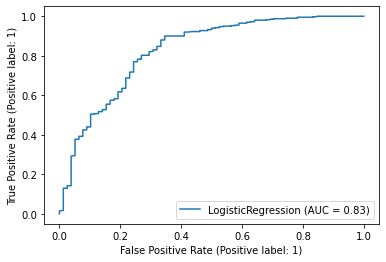

In [73]:
LRmodel = LogisticRegression(class_weight={0: w0, 1: w1})
LRmodel.fit(vec_X_train, y_train)

# Displays results of the model
model_results(LRmodel, vec_X_test, y_test)

# Returns Classification Report
get_classification_report(y_test, LRmodel.predict(vec_X_test))

## Keras Modeling

### Creating a wordcount

In [74]:
from collections import Counter

# Count unique words
def counter_word(tweets):
    count = Counter()
    for tweet in tweets: # iterate over each line of text in the dataframe
        for word in tweet.split(): # splits so each line becomes an array of words
            count[word] += 1 # iterates over the words & places them into a counter
    return count

counter = counter_word(data.tweets_clean)

In [75]:
len(counter)

5798

In [76]:
counter

Counter({'hrs': 2,
         'tweeting': 11,
         'riseaustin': 2,
         'dead': 4,
         'need': 71,
         'upgrade': 7,
         'plugin': 4,
         'stations': 2,
         'jessedee': 1,
         'know': 50,
         'fludapp': 1,
         'awesome': 91,
         'ipadiphone': 7,
         'youll': 10,
         'likely': 3,
         'appreciate': 4,
         'design': 60,
         'also': 40,
         'theyre': 24,
         'giving': 24,
         'free': 103,
         'ts': 3,
         'swonderlin': 1,
         'wait': 46,
         'sale': 9,
         'hope': 20,
         'years': 33,
         'festival': 14,
         'isnt': 16,
         'crashy': 2,
         'sxtxstate': 4,
         'great': 131,
         'stuff': 21,
         'fri': 4,
         'marissa': 56,
         'mayer': 63,
         'tim': 11,
         'oreilly': 4,
         'tech': 45,
         'booksconferences': 2,
         'amp': 169,
         'matt': 2,
         'mullenweg': 3,
         'wordpress': 4,
  

In [77]:
counter.most_common(5) #Identifies the most common words

[('store', 532), ('new', 357), ('popup', 210), ('android', 193), ('amp', 169)]

In [78]:
# Capture the number of unique words that will be present for tokenization
num_unique_words = len(counter)

### Train & Test Split

In [79]:
# Prepare data for modeling with Keras
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

In [80]:
X_train.shape, X_test.shape

((2704,), (478,))

### Tokenization & Sequencing

In [81]:
# Tokenize our data for modeling.
# Vectorize a text corpus by turning each text into a sequence of integers

tokenizer = Tokenizer(num_words = num_unique_words)
tokenizer.fit_on_texts(X_train) # Fits our tokenizer to the training data

In [82]:
# Each word has a unique index
word_index = tokenizer.word_index

word_index

{'store': 1,
 'new': 2,
 'popup': 3,
 'android': 4,
 'amp': 5,
 'get': 6,
 'launch': 7,
 'via': 8,
 'line': 9,
 'time': 10,
 'great': 11,
 'like': 12,
 'social': 13,
 'cool': 14,
 'party': 15,
 'im': 16,
 'circles': 17,
 'one': 18,
 'free': 19,
 'day': 20,
 'today': 21,
 'maps': 22,
 'people': 23,
 'awesome': 24,
 'love': 25,
 'go': 26,
 'apps': 27,
 'good': 28,
 'dont': 29,
 'temporary': 30,
 'opening': 31,
 'network': 32,
 'downtown': 33,
 'mobile': 34,
 'check': 35,
 'even': 36,
 'got': 37,
 'thanks': 38,
 'see': 39,
 'going': 40,
 'w': 41,
 'first': 42,
 'open': 43,
 'need': 44,
 'mayer': 45,
 'really': 46,
 'users': 47,
 '\x89ûïmention': 48,
 'next': 49,
 'marissa': 50,
 'major': 51,
 'best': 52,
 'us': 53,
 'called': 54,
 'around': 55,
 'want': 56,
 'come': 57,
 'know': 58,
 'design': 59,
 'ever': 60,
 'pop': 61,
 'technology': 62,
 'wins': 63,
 'win': 64,
 'using': 65,
 'heard': 66,
 'would': 67,
 'think': 68,
 'googles': 69,
 'smart': 70,
 'use': 71,
 'news': 72,
 'nice': 73,
 

In [83]:
# Convert texts into sequences of their individual word_index numbers
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

In [84]:
print(X_train[60:65])
print(X_train_seq[60:65])

['opening popup store cool another reason im pissedimnotgoingtosxsw'
 'anyone leaving iphoneipad time kill airports flights download tiny wings youre welcome im sorry'
 'wonder theres anyone whos snagged supposedly theres store somewhere campus'
 'didnt go im still using oldschool novideo veryslow'
 'omg sign officially come grill amp you\x89ûªll get make case']
[[31, 3, 1, 14, 249, 569, 16, 2481], [250, 570, 658, 10, 1155, 1145, 659, 145, 927, 2482, 157, 1156, 16, 920], [506, 188, 250, 446, 2483, 1157, 188, 1, 1158, 2484], [227, 26, 16, 80, 65, 2485, 2486, 2487], [507, 571, 928, 57, 1582, 5, 929, 6, 128, 108]]


In [85]:
# Pad the sequences to have the same length
# This ensures the model will be able to read each entry equally

# Max number of words in a sequence
max_length = 20

sequence.pad_sequences

X_train_padded = sequence.pad_sequences(X_train_seq, maxlen=max_length, 
                                        padding="post", truncating="post") # We will use 0's for our padding
X_test_padded = sequence.pad_sequences(X_test_seq, maxlen=max_length, 
                                       padding="post", truncating="post")

X_train_padded.shape, X_test_padded.shape

((2704, 20), (478, 20))

In [86]:
X_train_padded[60]

array([  31,    3,    1,   14,  249,  569,   16, 2481,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0], dtype=int32)

In [87]:
# Checking out work
print(X_train[60])
print(X_train_seq[60])
print(X_train_padded[60])

opening popup store cool another reason im pissedimnotgoingtosxsw
[31, 3, 1, 14, 249, 569, 16, 2481]
[  31    3    1   14  249  569   16 2481    0    0    0    0    0    0
    0    0    0    0    0    0]


### Sequential Model

In [88]:
model_1 = keras.models.Sequential()
model_1.add(layers.Embedding(num_unique_words, 32, input_length=max_length))

model_1.add(layers.LSTM(64, dropout=0.1))
model_1.add(layers.Dense(1, activation="sigmoid"))

model_1.summary()

2022-04-30 19:44:50.911644: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-04-30 19:44:50.911681: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-04-30 19:44:50.911703: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (jupyter-pharoahevelyn): /proc/driver/nvidia/version does not exist
2022-04-30 19:44:50.911920: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 20, 32)            185536    
                                                                 
 lstm (LSTM)                 (None, 64)                24832     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 210,433
Trainable params: 210,433
Non-trainable params: 0
_________________________________________________________________


In [89]:
loss_1 = keras.losses.BinaryCrossentropy(from_logits=False)
optim_1 = tf.keras.optimizers.Adam(lr=0.001) # This did not work without adding tf at the beginning
metrics_1 = ["accuracy"]
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)

model_1.compile(loss = loss_1, optimizer = optim_1, metrics = metrics_1)

# Modeling with Balanced Data
results_1 = model_1.fit(X_train_padded, y_train, 
                        epochs=30, class_weight={0: w0, 1: w1}, 
                         validation_split=0.1, batch_size=10, callbacks=[callback], verbose=1)

Epoch 1/30
244/244 [==============================] - 5s 12ms/step - loss: 0.1891 - accuracy: 0.6457 - val_loss: 0.6930 - val_accuracy: 0.6015
Epoch 2/30
244/244 [==============================] - 2s 10ms/step - loss: 0.1886 - accuracy: 0.5092 - val_loss: 0.6648 - val_accuracy: 0.8339
Epoch 3/30
244/244 [==============================] - 3s 10ms/step - loss: 0.1405 - accuracy: 0.7912 - val_loss: 0.4197 - val_accuracy: 0.8155
Epoch 4/30
244/244 [==============================] - 3s 10ms/step - loss: 0.0881 - accuracy: 0.8800 - val_loss: 0.4085 - val_accuracy: 0.8413
Epoch 5/30
244/244 [==============================] - 2s 10ms/step - loss: 0.0621 - accuracy: 0.9309 - val_loss: 0.4303 - val_accuracy: 0.8229
Epoch 6/30
244/244 [==============================] - 2s 10ms/step - loss: 0.0439 - accuracy: 0.9523 - val_loss: 0.3710 - val_accuracy: 0.8561
Epoch 7/30
244/244 [==============================] - 2s 10ms/step - loss: 0.0309 - accuracy: 0.9708 - val_loss: 0.3522 - val_accuracy: 0.8635

In [90]:
predictions = model_1.predict(X_test_padded)
predictions = [1 if p > 0.5 else 0 for p in predictions]

In [91]:
# A display of the model's performance on testing data
print(X_train[:7])

print(y_train[:7])
print(predictions[:7])

['turn physical messaging platform holler gram cheeky built'
 'hey lucky dogs ipads check holler gram'
 'dear please tell us soon circles unveiled thanks'
 'fab spilled beans next platform flipboard iphoneworkin sxflip'
 'must see android quotbizzyquot'
 'store literally built conference store photo'
 'puts pop store folks awesome marketing audience']
[1 1 1 1 1 1 1]
[1, 1, 1, 0, 1, 1, 1]


In [92]:
# Defining a function that visualizes the accuracy & loss scores on both training & tets sets
def visualize_training_results(results):
    history = results.history
    
    # Loss Line Plot
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    # Accuracy Line Plot
    plt.figure()
    plt.plot(history['val_accuracy'])
    plt.plot(history['accuracy'])
    plt.legend(['val_accuracy', 'accuracy'])
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.show()

In [93]:
# Defining a function that returns predictions from the Keras model as a confusion matrix
def model_predictions(model):
    predictions = model.predict(X_test_padded)
    predictions = [1 if p > 0.5 else 0 for p in predictions]

    cm = confusion_matrix(y_test, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()

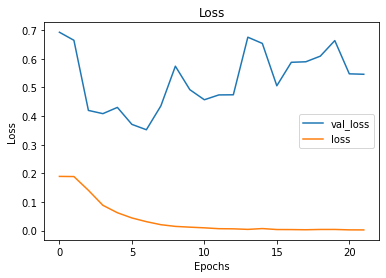

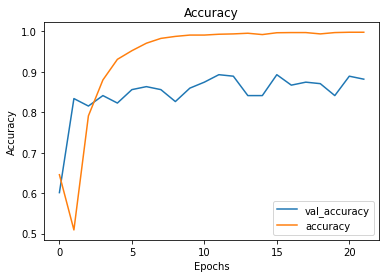

In [94]:
visualize_training_results(results_1)

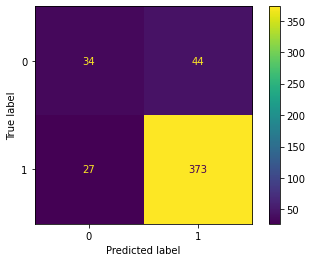

In [95]:
model_predictions(model_1)

Based on the above data & graphs, there might be signs of overfitting on this model. We'll investigate reducing this to improve model performance

### Reducing Overfitting
Approaching this , we will be adjusting some of the parameters on the model to iterate to higher performance.

We started by changing the activation function to tanh, and using an L1 regulizer.
<br>
After numerous slight parameter shifts, this was probaly the best iteration

In [96]:
model_2 = keras.models.Sequential()
model_2.add(layers.Embedding(num_unique_words, 32, input_length=max_length))

model_2.add(layers.LSTM(32, kernel_regularizer=tf.keras.regularizers.L1(0.02), 
                        dropout=0.5))
model_2.add(layers.Dense(1, activation="tanh"))

In [97]:
loss_2 = keras.losses.BinaryCrossentropy(from_logits=False)
optim_2 = tf.keras.optimizers.Adam(lr=0.0001) 
metrics_2 = ["accuracy"]

model_2.compile(loss = loss_2, optimizer = optim_2, metrics = metrics_2)

# Modeling with Balanced Data
results_2 = model_2.fit(X_train_padded, y_train, 
                        epochs=30, class_weight={0: w0, 1: w1}, 
                          validation_split=0.15, batch_size=20, callbacks=[callback], verbose=1)

Epoch 1/30
115/115 [==============================] - 3s 13ms/step - loss: 7.8309 - accuracy: 0.1636 - val_loss: 8.5676 - val_accuracy: 0.1576
Epoch 2/30
115/115 [==============================] - 1s 10ms/step - loss: 6.8588 - accuracy: 0.1636 - val_loss: 7.1405 - val_accuracy: 0.1576
Epoch 3/30
115/115 [==============================] - 1s 10ms/step - loss: 5.9875 - accuracy: 0.3547 - val_loss: 6.0756 - val_accuracy: 0.5911
Epoch 4/30
115/115 [==============================] - 1s 10ms/step - loss: 5.2032 - accuracy: 0.6815 - val_loss: 5.3427 - val_accuracy: 0.5345
Epoch 5/30
115/115 [==============================] - 1s 10ms/step - loss: 4.4792 - accuracy: 0.6897 - val_loss: 4.5972 - val_accuracy: 0.7241
Epoch 6/30
115/115 [==============================] - 1s 10ms/step - loss: 3.8148 - accuracy: 0.7894 - val_loss: 3.9212 - val_accuracy: 0.8227
Epoch 7/30
115/115 [==============================] - 1s 10ms/step - loss: 3.2057 - accuracy: 0.8538 - val_loss: 3.3658 - val_accuracy: 0.7660

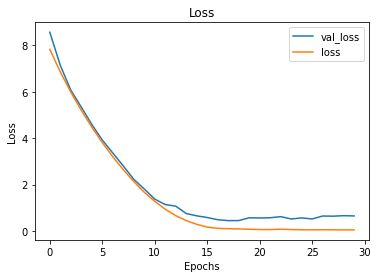

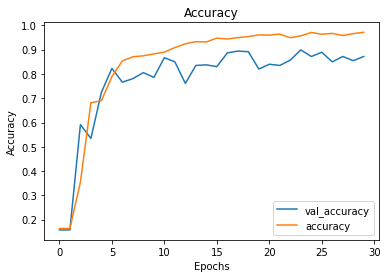

In [98]:
visualize_training_results(results_2)

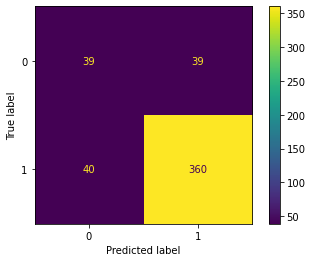

In [99]:
model_predictions(model_2)

# Conclusions

## Best Model:

### `Keras Model after parameter tuning`

#### This is because: 
* The confusion matrix reports a higher correct classification of 0: negative sentiment.
* Though the Keras models have slightly higher accuracy scores, none performed as well as the Logistic Regression at correctly classifying negative sentiment while having lower amounts of false positives & negatives.

Features: `tweets`, `emotion`

# Recommendations

#### Usage for our model:
* Use this model to predict Twitter sentiment for future events, or even with a live API
* Use this model to predict if negative tweets are about Apple or Google
    * You can do this by splitting the original dataframe only to include negative tweets and have the products be the target column
* Build a web app using techniques in this notebook to predict twitter sentiment

#### Suggestions:
* To further increase model performance, we could implement a grid search on all models to discover if higher model performance is probable.